In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import seaborn as sns
plt.rcParams["figure.figsize"] = (15, 10)
plt.rcParams["figure.dpi"] = 125
plt.rcParams["font.size"] = 14
plt.rcParams['font.family'] = ['sans-serif']
plt.rcParams['font.sans-serif'] = ['DejaVu Sans']
plt.style.use('ggplot')
sns.set_style("whitegrid", {'axes.grid': False})
plt.rcParams['image.cmap'] = 'viridis' # grayscale looks better

In [2]:
from pathlib import Path
import numpy as np
import pandas as pd
from skimage.io import imread as imread
from skimage.util import montage as montage2d
from skimage.color import label2rgb
from PIL import Image
base_dir = Path(r"C:\Users\DEVADHARSHINI K\Downloads\ham10000-20240224T105323Z-001\ham10000")

In [3]:
image_overview_df = pd.read_csv(base_dir / r"C:\Users\DEVADHARSHINI K\Downloads\ham10000-20240224T105323Z-001\ham10000\HAM10000_metadata.csv")
all_image_ids = {c_path.stem: c_path for c_path in base_dir.glob('**/*.jpg')}
image_overview_df['image_path'] = image_overview_df['image_id'].map(all_image_ids.get)
image_overview_df.dropna(inplace=True) # remove values that are missing
print(image_overview_df.shape[0], 'image, recipe pairs loaded')
image_overview_df.sample(3)

5223 image, recipe pairs loaded


,lesion_id,image_id,dx,dx_type,age,sex,localization,image_path
6480,HAM_0007226,ISIC_0027946,nv,follow_up,35.0,female,trunk,C:\Users\DEVADHARSHINI K\Downloads\ham10000-20...
2537,HAM_0007428,ISIC_0031762,bcc,histo,75.0,female,face,C:\Users\DEVADHARSHINI K\Downloads\ham10000-20...
7712,HAM_0003676,ISIC_0032530,nv,histo,25.0,female,lower extremity,C:\Users\DEVADHARSHINI K\Downloads\ham10000-20...


In [4]:
image_overview_df.drop(['age'], axis=1).describe()

,lesion_id,image_id,dx,dx_type,sex,localization,image_path
count,5223,5223,5223,5223,5223,5223,5223
unique,4435,5223,7,4,3,15,5223
top,HAM_0003789,ISIC_0025030,nv,histo,male,back,C:\Users\DEVADHARSHINI K\Downloads\ham10000-20...
freq,4,1,3509,2792,2830,1149,1


In [5]:
dx_name_dict = {
    'nv': 'melanocytic nevi',
    'mel': 'melanoma',
    'bcc': 'basal cell carcinoma',
    'akiec': 'Actinic keratoses and intraepithelial carcinoma',
    'vasc': 'vascular lesions',
    'bkl': 'benign keratosis-like',
    'df': 'dermatofibroma'
}
image_overview_df['dx_name'] = image_overview_df['dx'].map(dx_name_dict.get)
dx_name_id_dict = {name: id for id, name in enumerate(dx_name_dict.keys())}
image_overview_df['dx_id'] = image_overview_df['dx'].map(dx_name_id_dict.get).astype(int)
image_overview_df.sample(3)

,lesion_id,image_id,dx,dx_type,age,sex,localization,image_path,dx_name,dx_id
3303,HAM_0007155,ISIC_0025056,nv,follow_up,45.0,female,upper extremity,C:\Users\DEVADHARSHINI K\Downloads\ham10000-20...,melanocytic nevi,0
2052,HAM_0004654,ISIC_0027130,mel,histo,70.0,male,chest,C:\Users\DEVADHARSHINI K\Downloads\ham10000-20...,melanoma,1
6375,HAM_0006571,ISIC_0025418,nv,follow_up,30.0,female,upper extremity,C:\Users\DEVADHARSHINI K\Downloads\ham10000-20...,melanocytic nevi,0


In [6]:
image_overview_df['dx_name'].value_counts()

melanocytic nevi                                   3509
melanoma                                            583
benign keratosis-like                               557
basal cell carcinoma                                271
Actinic keratoses and intraepithelial carcinoma     158
vascular lesions                                     75
dermatofibroma                                       70
Name: dx_name, dtype: int64

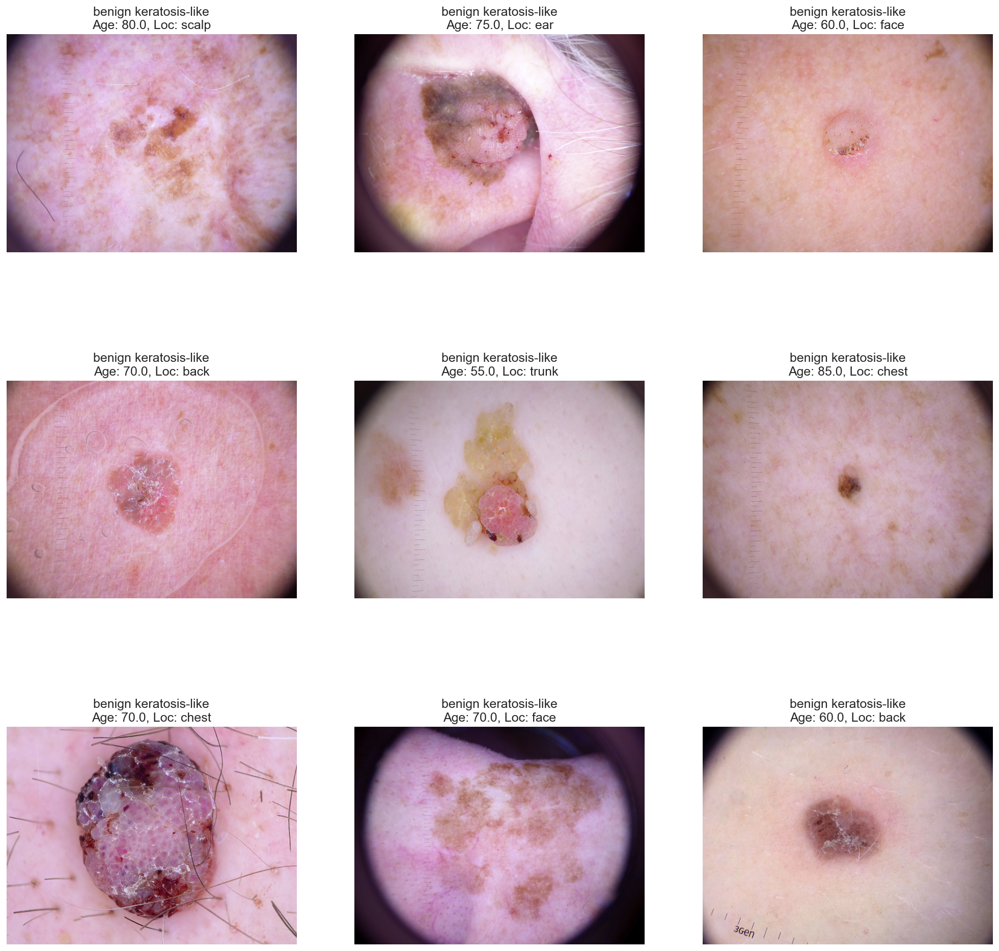

In [7]:
fig, m_axs = plt.subplots(3, 3, figsize=(20, 20))
for c_ax, (_, c_row) in zip(m_axs.flatten(), 
                            image_overview_df.head(9).iterrows()):
    c_ax.imshow(imread(c_row['image_path']))
    c_ax.set_title('{dx_name}\nAge: {age}, Loc: {localization}'.format(**c_row))
    c_ax.axis('off')

In [8]:
test_row = image_overview_df.iloc[1]
print(test_row)

lesion_id                                             HAM_0001466
image_id                                             ISIC_0027850
dx                                                            bkl
dx_type                                                     histo
age                                                          75.0
sex                                                          male
localization                                                  ear
image_path      C:\Users\DEVADHARSHINI K\Downloads\ham10000-20...
dx_name                                     benign keratosis-like
dx_id                                                           5
Name: 5, dtype: object


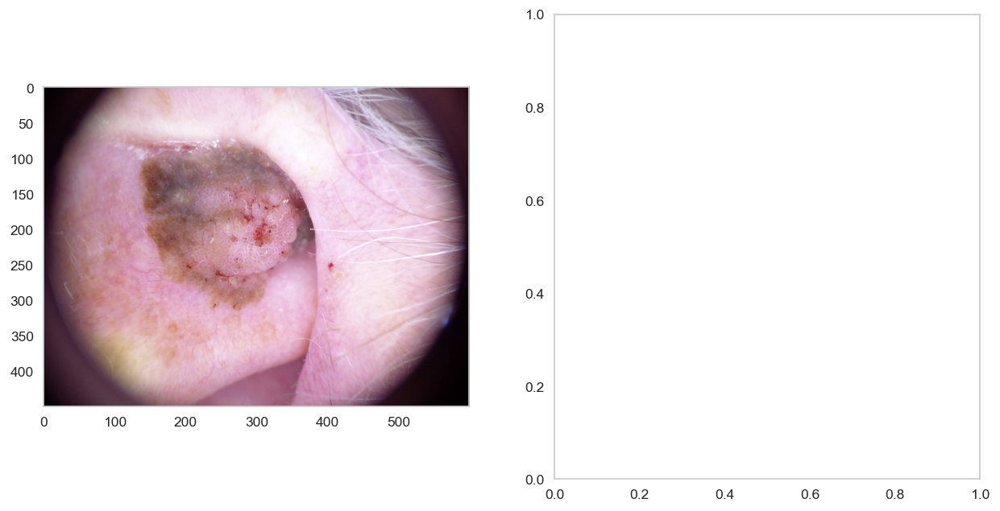

In [9]:
test_image = Image.open(test_row['image_path']) # normal image
# convert to 8bit color (animated GIF) and then back
web_image = test_image.convert('P', palette='WEB', dither=None)
few_color_image = web_image.convert('RGB')
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(test_image)

In [10]:
print('Unique colors before', len(set([tuple(rgb) for rgb in np.array(test_image).reshape((-1, 3))])))
print('Unique colors after', len(set([tuple(rgb) for rgb in np.array(few_color_image).reshape((-1, 3))])))

Unique colors before 62907
Unique colors after 74


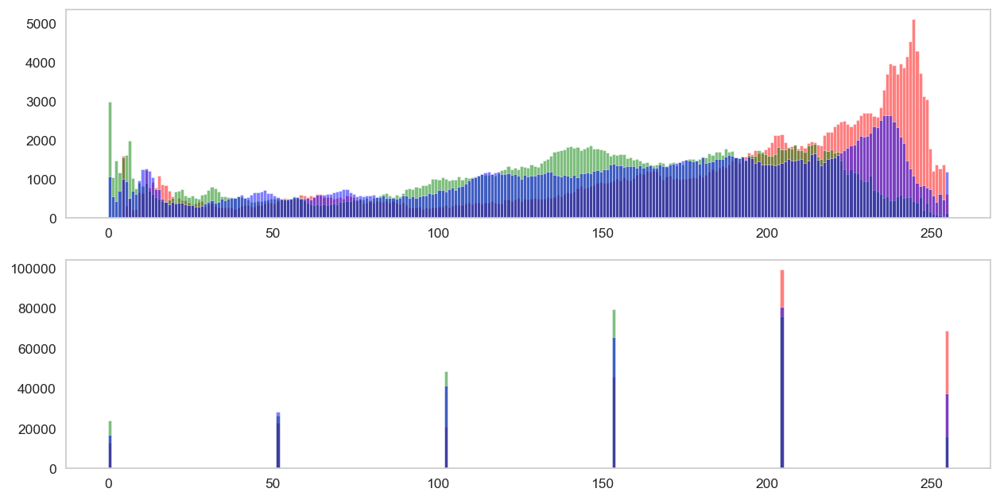

In [11]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 6))
for c_channel, c_name in enumerate(['red', 'green', 'blue']):
    ax1.hist(np.array(test_image)[:, :, c_channel].ravel(), 
             color=c_name[0], 
             label=c_name, 
             bins=np.arange(256), 
             alpha=0.5)
    ax2.hist(np.array(few_color_image)[:, :, c_channel].ravel(), 
             color=c_name[0], 
             label=c_name, 
             bins=np.arange(256), 
             alpha=0.5)


Text(0, 0.5, 'Pixel Count')

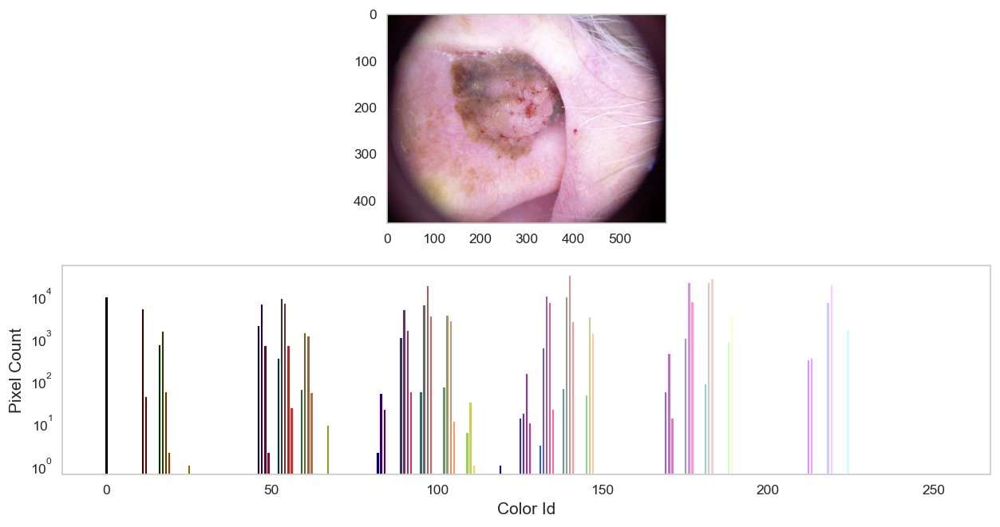

In [12]:
idx_to_color = np.array(web_image.getpalette()).reshape((-1, 3))/255.0
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 6))
ax1.imshow(few_color_image)
counts, bins = np.histogram(web_image, bins=np.arange(256))
for i in range(counts.shape[0]):
    ax2.bar(bins[i], counts[i], color=idx_to_color[i])
ax2.set_yscale('log')
ax2.set_xlabel('Color Id')
ax2.set_ylabel('Pixel Count')

In [13]:
def color_count_feature(in_path):
    raw_image = Image.open(in_path) 
    web_image = raw_image.convert('P', palette='WEB', dither=None)
    counts, bins = np.histogram(np.array(web_image).ravel(), bins=np.arange(256))
    return counts*1.0/np.prod(web_image.size) # normalize output

In [14]:
%%time
image_subset_df = image_overview_df.sample(100).copy()
image_subset_df['color_features'] = image_subset_df['image_path'].map(color_count_feature)
image_subset_df.sample(3)

CPU times: total: 3.44 s
Wall time: 4.93 s


,lesion_id,image_id,dx,dx_type,age,sex,localization,image_path,dx_name,dx_id,color_features
5755,HAM_0004335,ISIC_0025187,nv,follow_up,60.0,female,back,C:\Users\DEVADHARSHINI K\Downloads\ham10000-20...,melanocytic nevi,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
5535,HAM_0000173,ISIC_0025026,nv,follow_up,50.0,female,back,C:\Users\DEVADHARSHINI K\Downloads\ham10000-20...,melanocytic nevi,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
8602,HAM_0001799,ISIC_0028675,nv,histo,40.0,female,foot,C:\Users\DEVADHARSHINI K\Downloads\ham10000-20...,melanocytic nevi,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


C:\Users\DEVADHARSHINI K\AppData\Local\Temp\ipykernel_25008\185556786.py:8: RuntimeWarning: invalid value encountered in divide
  ax2.imshow(combined_features/color_wise_average, vmin=0.05, vmax=20)


Text(0, 0.5, 'Frequency')

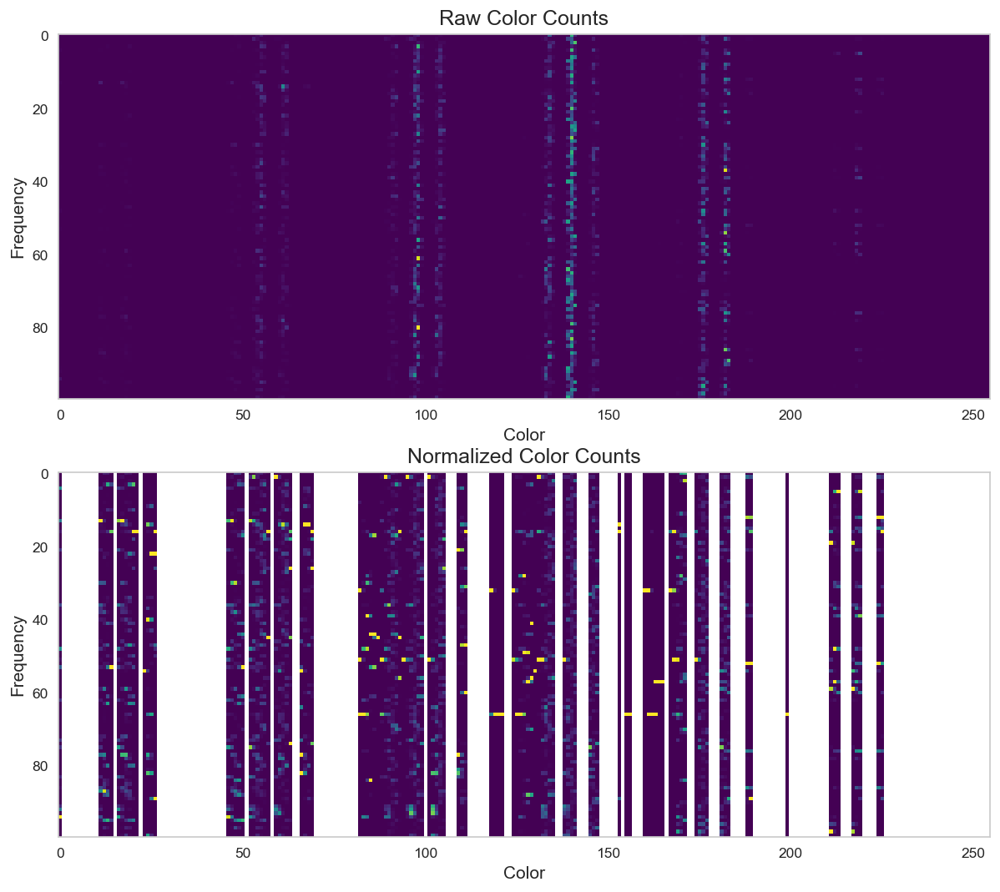

In [15]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10))
combined_features = np.stack(image_subset_df['color_features'].values, 0)
ax1.imshow(combined_features)
ax1.set_title('Raw Color Counts')
ax1.set_xlabel('Color')
ax1.set_ylabel('Frequency')
color_wise_average = np.tile(np.mean(combined_features, 0, keepdims=True), (combined_features.shape[0], 1))
ax2.imshow(combined_features/color_wise_average, vmin=0.05, vmax=20)
ax2.set_title('Normalized Color Counts')
ax2.set_xlabel('Color')
ax2.set_ylabel('Frequency')

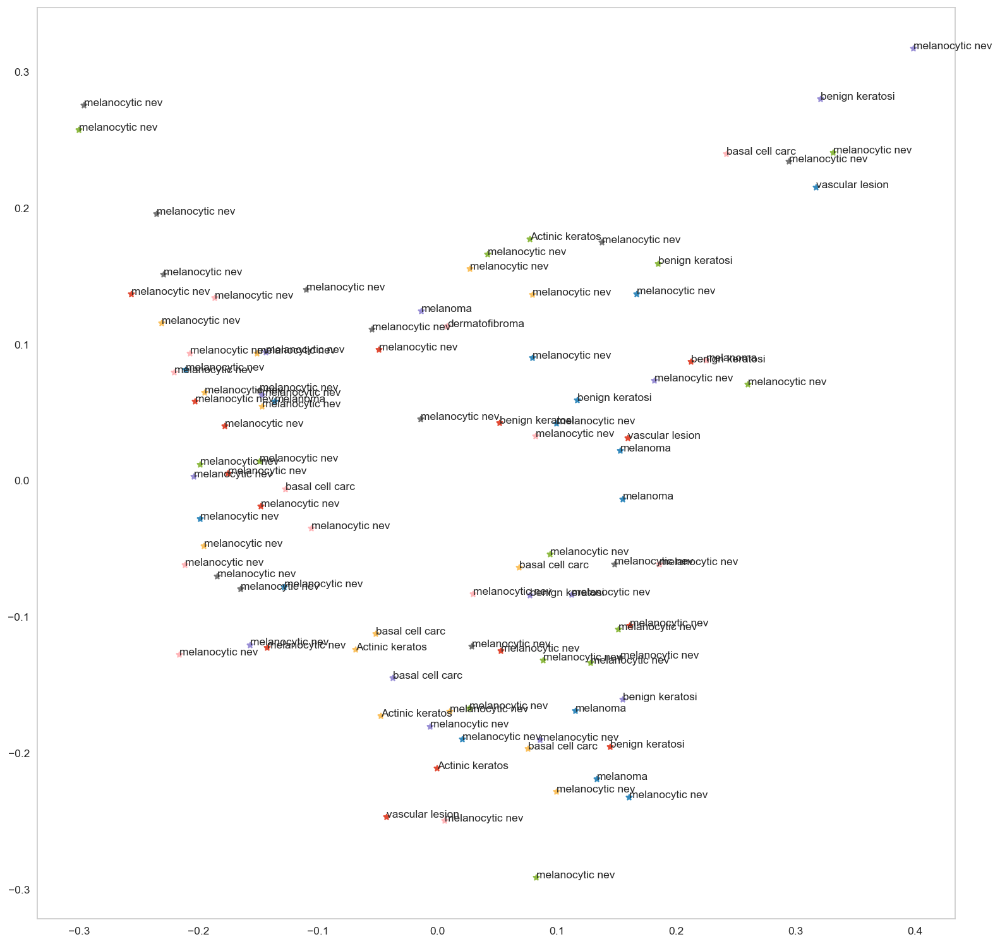

In [16]:
from sklearn.decomposition import PCA
xy_pca = PCA(n_components=2)
xy_coords = xy_pca.fit_transform(combined_features)
image_subset_df['x'] = xy_coords[:, 0]
image_subset_df['y'] = xy_coords[:, 1]
fig, ax1 = plt.subplots(1,1, figsize=(15, 15))
for _, c_row in image_subset_df.iterrows():
    ax1.plot(c_row['x'], c_row['y'], '*')
    ax1.text(s=c_row['dx_name'][:15], x=c_row['x'], y=c_row['y'])

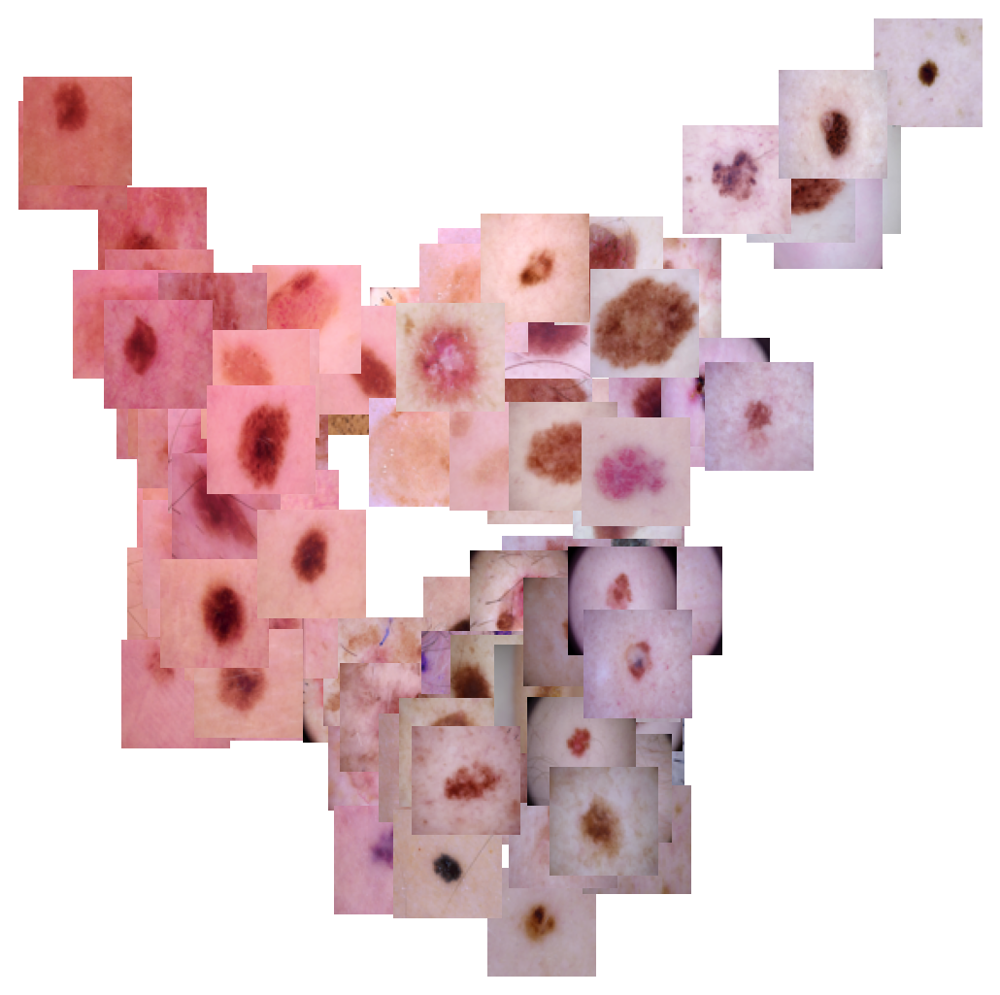

In [17]:
def show_xy_images(in_df, image_zoom=1):
    fig, ax1 = plt.subplots(1,1, figsize=(10, 10))
    artists = []
    for _, c_row in in_df.iterrows():
        c_img = Image.open(c_row['image_path']).resize((64, 64))
        img = OffsetImage(c_img, zoom=image_zoom)
        ab = AnnotationBbox(img, (c_row['x'], c_row['y']), xycoords='data', frameon=False)
        artists.append(ax1.add_artist(ab))
    ax1.update_datalim(in_df[['x', 'y']])
    ax1.autoscale()
    ax1.axis('off')
show_xy_images(image_subset_df)

In [18]:
from sklearn.manifold import TSNE
tsne = TSNE(n_iter=250, verbose=True)
xy_coords = tsne.fit_transform(combined_features)
image_subset_df['x'] = xy_coords[:, 0]
image_subset_df['y'] = xy_coords[:, 1]

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 100 samples in 0.000s...
[t-SNE] Computed neighbors for 100 samples in 0.157s...
[t-SNE] Computed conditional probabilities for sample 100 / 100
[t-SNE] Mean sigma: 0.186888
[t-SNE] KL divergence after 250 iterations with early exaggeration: 53.444141
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525844996598917476803157260780028538760589558632766878171540458953514382464234321326889464182768467546703537516986049910576551282076245490090389328944075868508455133942304583236903222948165808559332123348274797826204144723168738177180919299881250404026184124858368.000000


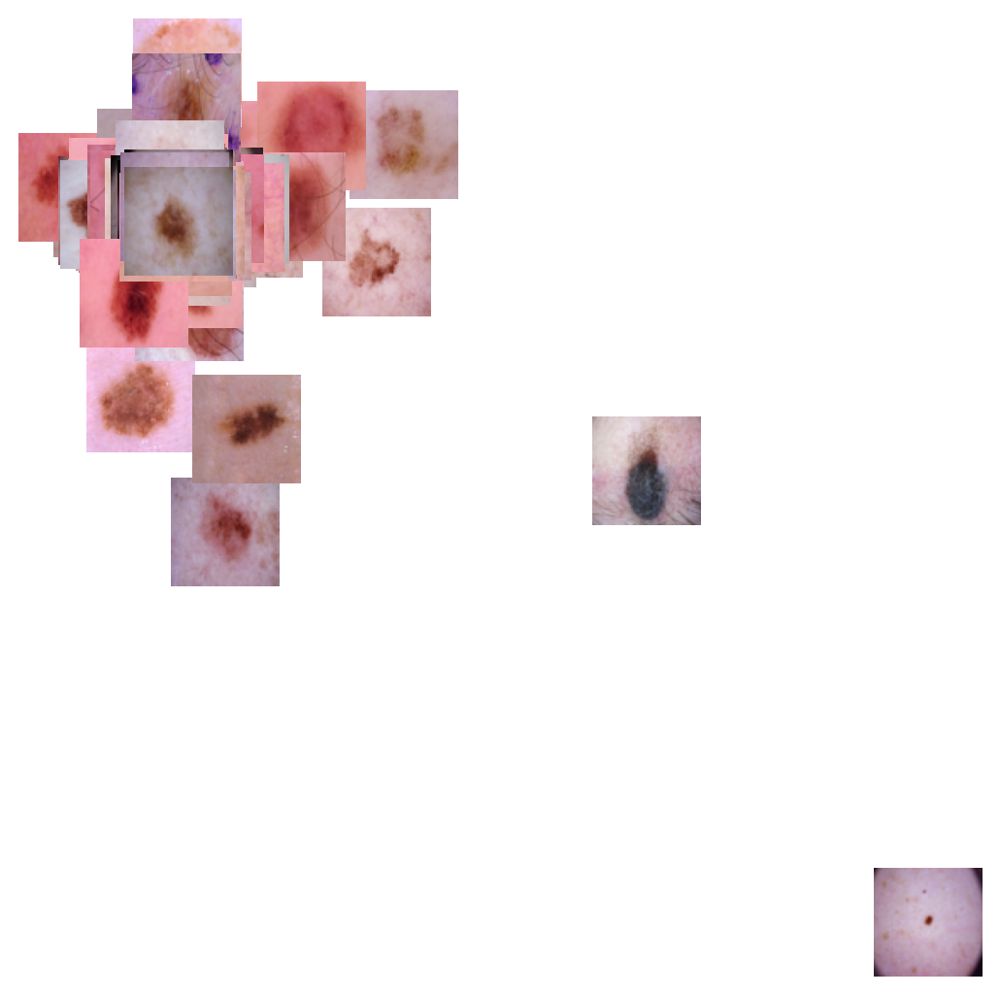

In [19]:
show_xy_images(image_subset_df)

In [20]:
%%time
image_overview_df['color_features'] = image_overview_df['image_path'].map(color_count_feature).map(lambda x: x.tolist())
image_overview_df.sample(3)

CPU times: total: 3min 4s
Wall time: 4min 6s


,lesion_id,image_id,dx,dx_type,age,sex,localization,image_path,dx_name,dx_id,color_features
7135,HAM_0006080,ISIC_0032891,nv,histo,40.0,male,upper extremity,C:\Users\DEVADHARSHINI K\Downloads\ham10000-20...,melanocytic nevi,0,"[0.05279259259259259, 0.0, 0.0, 0.0, 0.0, 0.0,..."
7478,HAM_0005433,ISIC_0033298,nv,histo,55.0,female,trunk,C:\Users\DEVADHARSHINI K\Downloads\ham10000-20...,melanocytic nevi,0,"[0.057581481481481483, 0.0, 0.0, 0.0, 0.0, 0.0..."
8216,HAM_0002031,ISIC_0031917,nv,histo,30.0,male,back,C:\Users\DEVADHARSHINI K\Downloads\ham10000-20...,melanocytic nevi,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [21]:
image_overview_df['image_path'] = image_overview_df['image_path'].map(str)
image_overview_df.to_json('color_features.json')

In [22]:
import warnings # tf needs to learn to stfu
warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=UserWarning)
warnings.simplefilter(action="ignore", category=RuntimeWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)

In [23]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams["figure.figsize"] = (15, 10)
plt.rcParams["figure.dpi"] = 125
plt.rcParams["font.size"] = 14
plt.rcParams['font.family'] = ['sans-serif']
plt.rcParams['font.sans-serif'] = ['DejaVu Sans']
plt.style.use('ggplot')
sns.set_style("whitegrid", {'axes.grid': False})
plt.rcParams['image.cmap'] = 'gray' # grayscale looks better
from itertools import cycle
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

In [24]:
from pathlib import Path
import numpy as np
import pandas as pd
import os
from skimage.io import imread as imread
from skimage.util import montage
montage_rgb = lambda x: np.stack([montage(x[:, :, :, i]) for i in range(x.shape[3])], -1)
from skimage.color import label2rgb
image_dir = Path(r'C:\Users\DEVADHARSHINI K\Downloads\ham10000-20240224T105323Z-001\ham10000')
mapping_file = Path('color_features.json')
skin_df = pd.read_json(mapping_file)
#skin_df['image_path'] = skin_df['image_path'].map(lambda x: image_dir / 'subset' / x) 
print(skin_df['image_path'].map(lambda x: Path(x).exists()).value_counts())
skin_df.sample(2)

True    5223
Name: image_path, dtype: int64


,lesion_id,image_id,dx,dx_type,age,sex,localization,image_path,dx_name,dx_id,color_features
1304,HAM_0000152,ISIC_0032244,mel,histo,75,female,face,C:\Users\DEVADHARSHINI K\Downloads\ham10000-20...,melanoma,1,"[0.0024740741, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0..."
8357,HAM_0001817,ISIC_0025231,nv,histo,75,male,trunk,C:\Users\DEVADHARSHINI K\Downloads\ham10000-20...,melanocytic nevi,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [25]:
from sklearn.model_selection import train_test_split
raw_train_df, valid_df = train_test_split(skin_df, 
                 test_size = 0.3, 
                  # hack to make stratification work                  
                 stratify = skin_df['dx_id'])
print(raw_train_df.shape[0], 'training masks')
print(valid_df.shape[0], 'validation masks')

3656 training masks
1567 validation masks


In [26]:
GAUSSIAN_NOISE = 0.05
# number of validation images to use
VALID_IMG_COUNT = 1500
BASE_MODEL='InceptionV3' # ['VGG16', 'RESNET52', 'InceptionV3', 'Xception', 'DenseNet169', 'DenseNet121']
IMG_SIZE = (224, 224) # [(224, 224), (384, 384), (512, 512), (640, 640)]
BATCH_SIZE = 64 # [1, 8, 16, 24]
DROPOUT = 0.5
DENSE_COUNT = 256
SAMPLE_PER_GROUP = 2200
LEARN_RATE = 2e-4
EPOCHS = 10
FLATTEN = True
RGB_FLIP = 1 # should rgb be flipped when rendering images

In [27]:
train_df = raw_train_df.\
     groupby('dx_name').\
     apply(lambda x: x.sample(SAMPLE_PER_GROUP//2, replace=True)).\
     reset_index(drop=True)
train_df.shape[0]

7700

In [28]:
from keras.preprocessing.image import ImageDataGenerator
if BASE_MODEL == 'MobileNet':
    from keras.applications.mobilenet_v2 import MobileNetV2 as PTModel, preprocess_input
elif BASE_MODEL=='VGG16':
    from keras.applications.vgg16 import VGG16 as PTModel, preprocess_input
elif BASE_MODEL=='RESNET52':
    from keras.applications.resnet50 import ResNet50 as PTModel, preprocess_input
elif BASE_MODEL=='InceptionV3':
    from keras.applications.inception_v3 import InceptionV3 as PTModel, preprocess_input
elif BASE_MODEL=='Xception':
    from keras.applications.xception import Xception as PTModel, preprocess_input
elif BASE_MODEL=='DenseNet169': 
    from keras.applications.densenet import DenseNet169 as PTModel, preprocess_input
elif BASE_MODEL=='DenseNet121':
    from keras.applications.densenet import DenseNet121 as PTModel, preprocess_input
else:
    raise ValueError('Unknown model: {}'.format(BASE_MODEL))

In [29]:
from keras.preprocessing.image import ImageDataGenerator
dg_args = dict(featurewise_center = False, 
                  samplewise_center = False,
                  rotation_range = 45, 
                  width_shift_range = 0.1, 
                  height_shift_range = 0.1, 
                  shear_range = 0.01,
                  zoom_range = [0.9, 1.25],  
                  brightness_range = [0.7, 1.3],
                   
                  horizontal_flip = True, 
                  vertical_flip = False,
                  fill_mode = 'reflect',
                   data_format = 'channels_last',
              preprocessing_function = preprocess_input)

valid_args = dict(fill_mode = 'reflect',
                   data_format = 'channels_last',
                  preprocessing_function = preprocess_input)

core_idg = ImageDataGenerator(**dg_args)
valid_idg = ImageDataGenerator(**valid_args)

In [30]:
def flow_from_dataframe(img_data_gen, raw_df, path_col, y_col, **dflow_args):
    """Keras update makes this much easier"""
    in_df = raw_df.copy()
    in_df[path_col] = in_df[path_col].map(str)
    in_df[y_col] = in_df[y_col].map(lambda x: np.array(x))
    df_gen = img_data_gen.flow_from_dataframe(in_df, 
                                              x_col=path_col,
                                              y_col=y_col,
                                    class_mode = 'raw',
                                    **dflow_args)
    # posthoc correction
    df_gen._targets = np.stack(df_gen.labels, 0)
    return df_gen

In [31]:
train_gen = flow_from_dataframe(core_idg, train_df, 
                             path_col = 'image_path',
                            y_col = 'dx_id', 
                            target_size = IMG_SIZE,
                             color_mode = 'rgb',
                            batch_size = BATCH_SIZE)

# used a fixed dataset for evaluating the algorithm
valid_x, valid_y = next(flow_from_dataframe(valid_idg, 
                               valid_df, 
                             path_col = 'image_path',
                            y_col = 'dx_id', 
                            target_size = IMG_SIZE,
                             color_mode = 'rgb',
                            batch_size = VALID_IMG_COUNT)) # one big batch
print(valid_x.shape, valid_y.shape)

Found 7700 validated image filenames.
Found 1567 validated image filenames.
(1500, 224, 224, 3) (1500,)


x (64, 224, 224, 3) float32 -1.0 1.0
y (64,) int64 0 6


Text(0.5, 1.0, 'images')

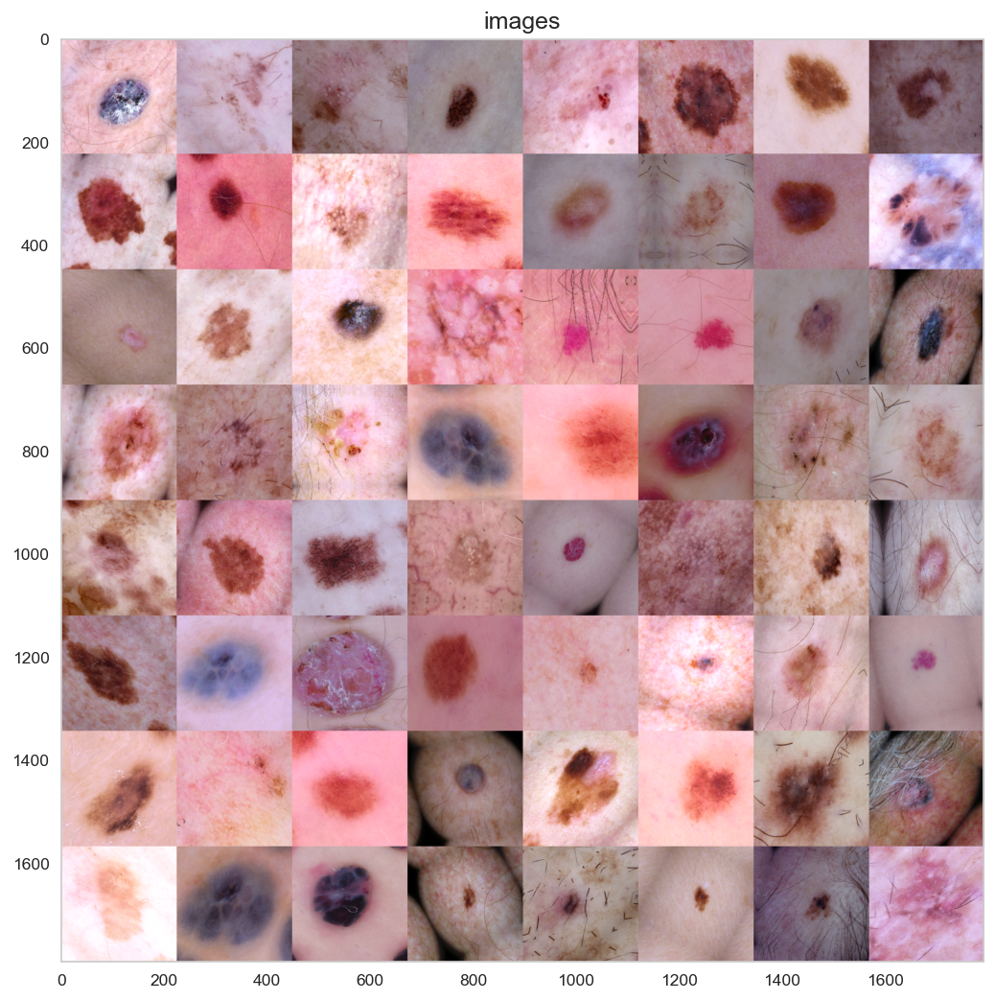

In [32]:
t_x, t_y = next(train_gen)
print('x', t_x.shape, t_x.dtype, t_x.min(), t_x.max())
print('y', t_y.shape, t_y.dtype, t_y.min(), t_y.max())
fig, (ax1) = plt.subplots(1, 1, figsize = (10, 10))
ax1.imshow(montage_rgb((t_x-t_x.min())/(t_x.max()-t_x.min()))[:, :, ::RGB_FLIP])
ax1.set_title('images')

(array([11., 14.,  0., 12.,  0., 12., 10.,  0.,  1.,  4.]),
 array([0. , 0.6, 1.2, 1.8, 2.4, 3. , 3.6, 4.2, 4.8, 5.4, 6. ]),
 <BarContainer object of 10 artists>)

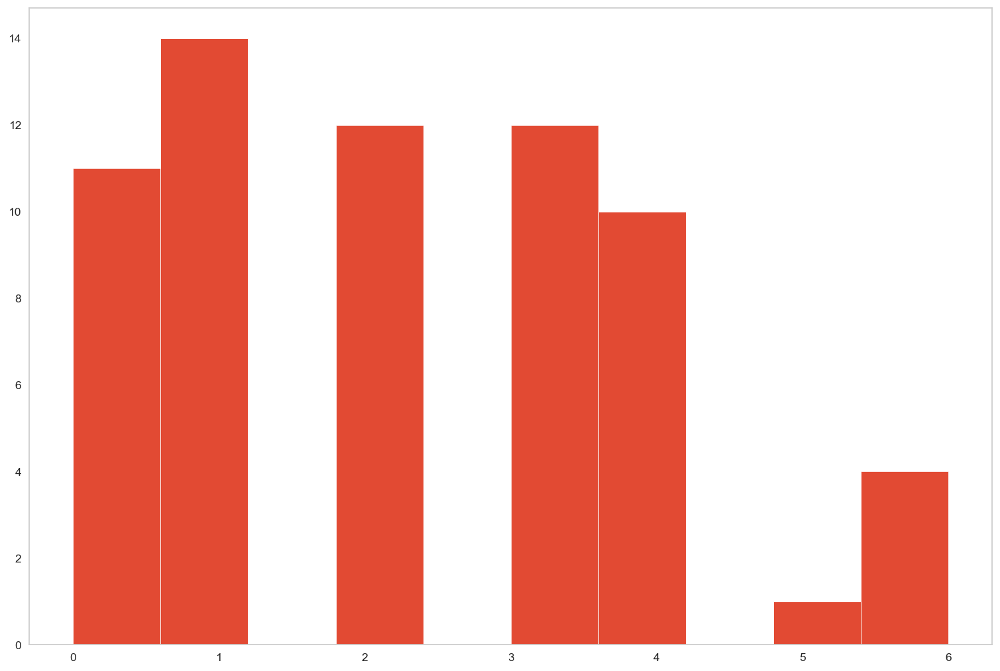

In [33]:
plt.hist(t_y.T)

In [34]:
base_pretrained_model = PTModel(input_shape =  t_x.shape[1:], 
                              include_top = False, weights = 'imagenet')
base_pretrained_model.trainable = False

In [35]:
from keras import models, layers
from keras.optimizers import Adam
img_in = layers.Input(t_x.shape[1:], name='Image_RGB_In')
img_noise = layers.GaussianNoise(GAUSSIAN_NOISE)(img_in)
pt_features = base_pretrained_model(img_noise)
pt_depth = base_pretrained_model.get_output_shape_at(0)[-1]
bn_features = layers.BatchNormalization()(pt_features)
feature_dropout = layers.SpatialDropout2D(DROPOUT)(bn_features)
if FLATTEN:
    flat_layer = layers.Flatten()(bn_features)
    collapsed_layer = layers.Dropout(DROPOUT)(flat_layer)
else:
    collapsed_layer = layers.GlobalAvgPool2D()(bn_features)
dr_steps = layers.Dropout(DROPOUT)(layers.Dense(DENSE_COUNT, activation = 'relu')(collapsed_layer))
out_layer = layers.Dense(train_df['dx_id'].max()+1, activation = 'softmax')(dr_steps)

skin_model = models.Model(inputs = [img_in], outputs = [out_layer], name = 'full_model')

skin_model.compile(optimizer = Adam(lr=LEARN_RATE), 
                   loss = 'sparse_categorical_crossentropy',
                   metrics = ['sparse_categorical_accuracy'])

skin_model.summary()

Model: "full_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Image_RGB_In (InputLayer)   [(None, 224, 224, 3)]     0         
                                                                 
 gaussian_noise (GaussianNoi  (None, 224, 224, 3)      0         
 se)                                                             
                                                                 
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 batch_normalization_94 (Bat  (None, 5, 5, 2048)       8192      
 chNormalization)                                                
                                                                 
 flatten (Flatten)           (None, 51200)             0         
                                                                 
 dropout (Dropout)           (None, 51200)             0

In [36]:
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
weight_path="{}_weights.best.hdf5".format('skin_cancer_detector')

checkpoint = ModelCheckpoint(weight_path, monitor='val_loss', verbose=1, 
                             save_best_only=True, mode='min', save_weights_only = True)

reduceLROnPlat = ReduceLROnPlateau(monitor='val_loss', factor=0.8, patience=10, verbose=1, mode='auto', epsilon=0.0001, cooldown=5, min_lr=0.0001)
early = EarlyStopping(monitor="val_loss", 
                      mode="min", 
                      patience=15) # probably needs to be more patient, but kaggle time is limited
callbacks_list = [checkpoint, early, reduceLROnPlat]

In [37]:
from IPython.display import clear_output
train_gen.batch_size = BATCH_SIZE
fit_results = skin_model.fit_generator(train_gen, 
                            steps_per_epoch = train_gen.samples//BATCH_SIZE,
                      validation_data = (valid_x, valid_y), 
                      epochs = EPOCHS, 
                      callbacks = callbacks_list,
                      workers = 3)

Epoch 1/10
120/120 [==============================] - ETA: 0s - loss: 1.7004 - sparse_categorical_accuracy: 0.4790
Epoch 1: val_loss improved from inf to 1.28317, saving model to skin_cancer_detector_weights.best.hdf5
120/120 [==============================] - 477s 4s/step - loss: 1.7004 - sparse_categorical_accuracy: 0.4790 - val_loss: 1.2832 - val_sparse_categorical_accuracy: 0.5287 - lr: 2.0000e-04
Epoch 2/10
120/120 [==============================] - ETA: 0s - loss: 1.2034 - sparse_categorical_accuracy: 0.5949
Epoch 2: val_loss did not improve from 1.28317
120/120 [==============================] - 463s 4s/step - loss: 1.2034 - sparse_categorical_accuracy: 0.5949 - val_loss: 1.3997 - val_sparse_categorical_accuracy: 0.4813 - lr: 2.0000e-04
Epoch 3/10
120/120 [==============================] - ETA: 0s - loss: 1.0369 - sparse_categorical_accuracy: 0.6413
Epoch 3: val_loss improved from 1.28317 to 1.22956, saving model to skin_cancer_detector_weights.best.hdf5
120/120 [===============

(0.0, 1.0)

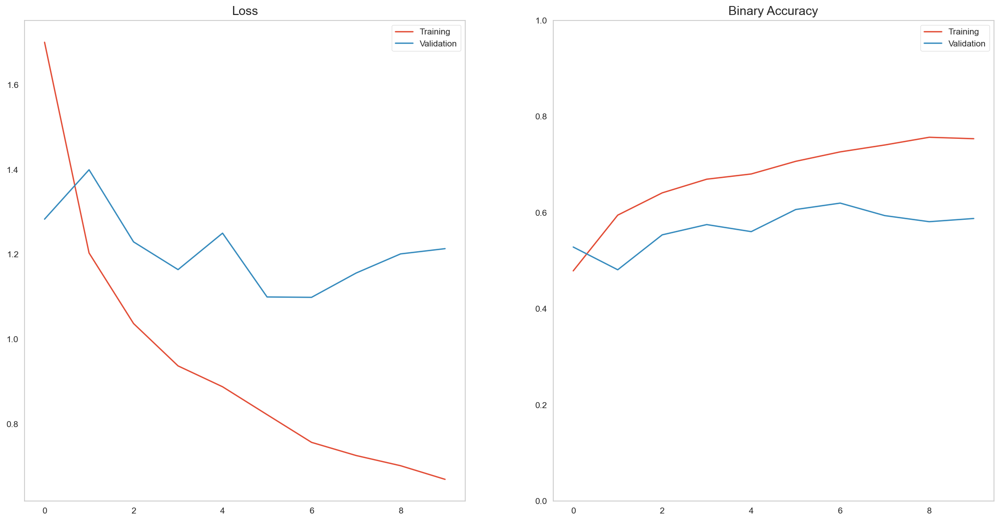

In [38]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (20, 10))
ax1.plot(fit_results.history['loss'], label='Training')
ax1.plot(fit_results.history['val_loss'], label='Validation')
ax1.legend()
ax1.set_title('Loss')
ax2.plot(fit_results.history['sparse_categorical_accuracy'], label='Training')
ax2.plot(fit_results.history['val_sparse_categorical_accuracy'], label='Validation')
ax2.legend()
ax2.set_title('Binary Accuracy')
ax2.set_ylim(0, 1)

In [39]:
skin_model.load_weights(weight_path)
skin_model.save('full_skin_cancer_model.h5')

In [40]:
for k, v in zip(skin_model.metrics_names, 
        skin_model.evaluate(valid_x, valid_y)):
    if k!='loss':
        print('{:40s}:\t{:2.1f}%'.format(k, 100*v))

47/47 [==============================] - 70s 1s/step - loss: 1.0987 - sparse_categorical_accuracy: 0.6200
sparse_categorical_accuracy             :	62.0%


In [41]:
dx_lookup_dict = train_df[['dx_name', 'dx_id']].drop_duplicates().set_index('dx_id').to_dict()['dx_name']

2/2 [==============================] - 6s 1s/step


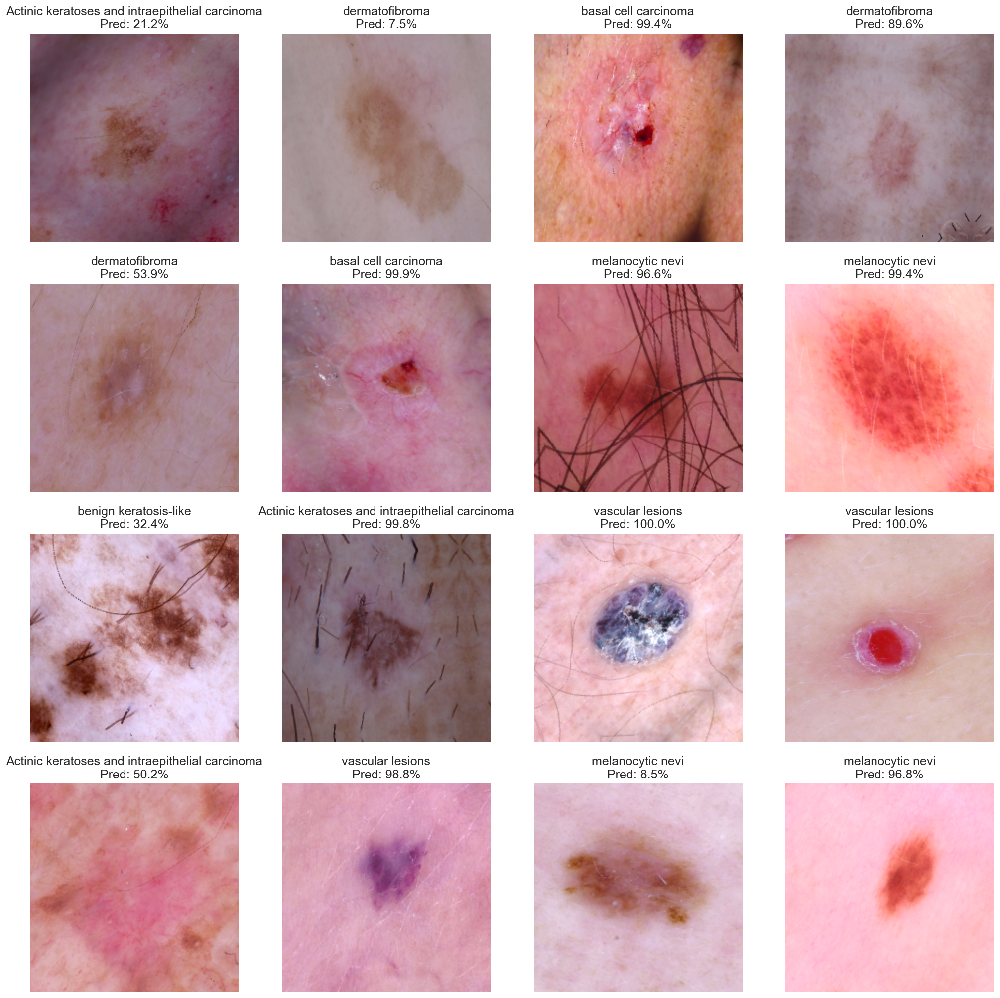

In [42]:
t_x, t_y = next(train_gen)
t_yp = skin_model.predict(t_x)
fig, (m_axs) = plt.subplots(4, 4, figsize = (20, 20))
for i, c_ax in enumerate(m_axs.flatten()):
    c_ax.imshow(((t_x[i]-t_x.min())/(t_x.max()-t_x.min()))[:, ::RGB_FLIP])
    c_title = '{}\nPred: {:2.1f}%'.format(dx_lookup_dict[t_y[i]], 100*t_yp[i, t_y[i]])
    c_ax.set_title(c_title)
    c_ax.axis('off')

188/188 [==============================] - 84s 433ms/step


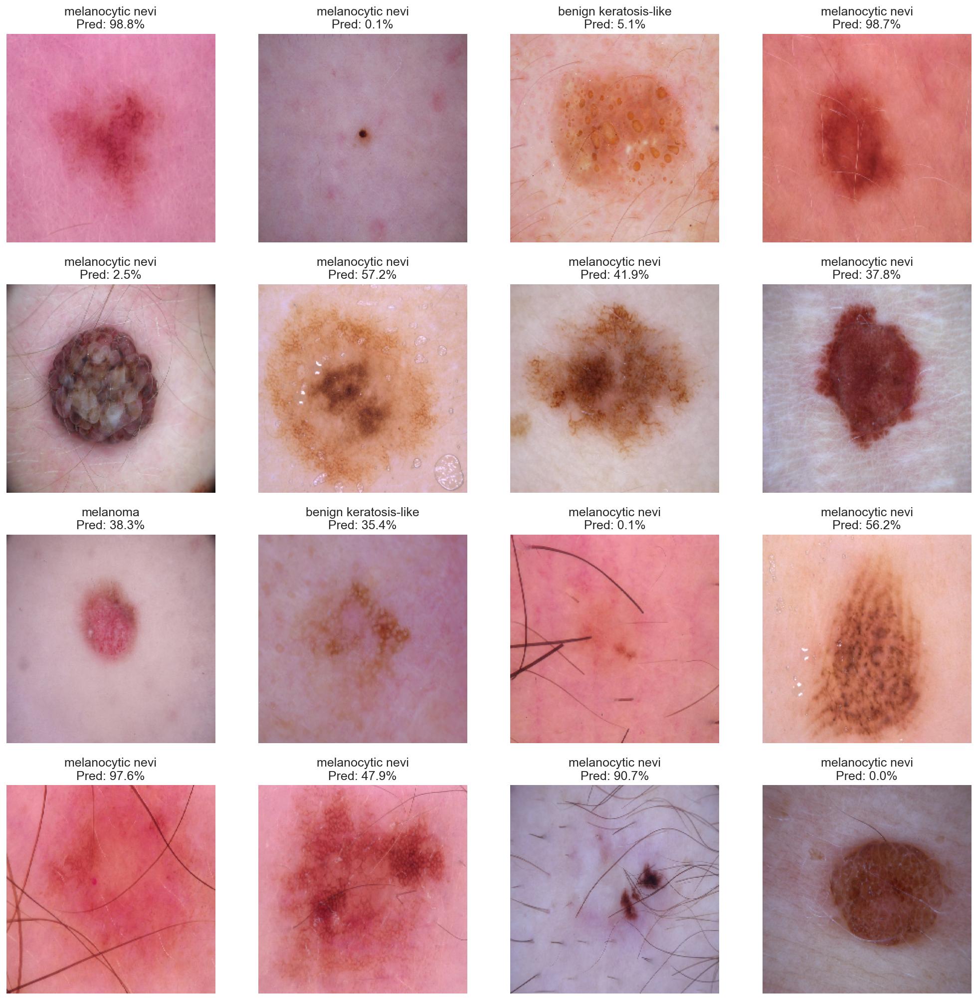

In [43]:
t_x, t_y = valid_x, valid_y
t_yp = skin_model.predict(t_x, batch_size=8, verbose=True)
fig, (m_axs) = plt.subplots(4, 4, figsize = (20, 20))
for i, c_ax in enumerate(m_axs.flatten()):
    c_ax.imshow(((t_x[i]-t_x.min())/(t_x.max()-t_x.min()))[:, ::RGB_FLIP])
    c_title = '{}\nPred: {:2.1f}%'.format(dx_lookup_dict[t_y[i]], 100*t_yp[i, t_y[i]])
    c_ax.set_title(c_title)
    c_ax.axis('off')

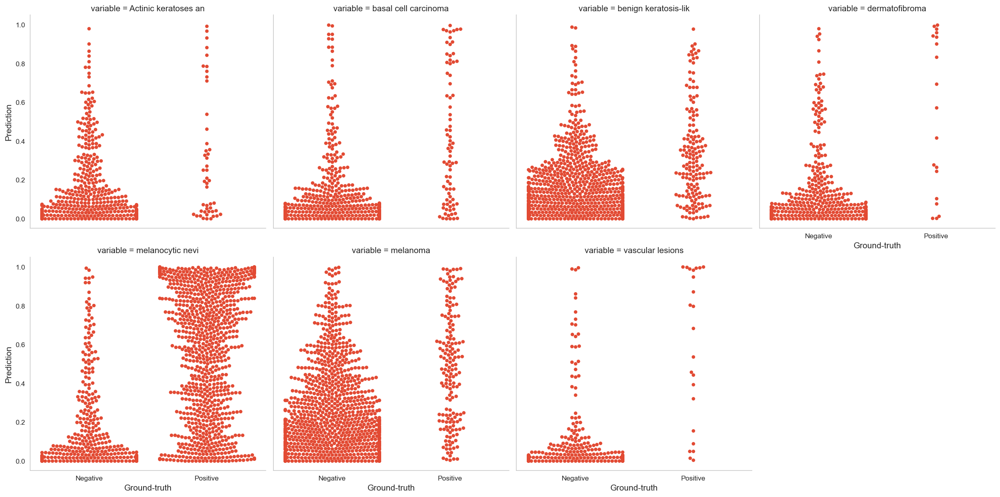

In [44]:
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder(sparse=False)
skin_conditions = [dx_lookup_dict[k][:20] for k in range(len(dx_lookup_dict))]
t_y_ohe = ohe.fit_transform(t_y.reshape(-1, 1))
pred_df = pd.concat([
    pd.DataFrame(t_yp, columns=skin_conditions).assign(source='Prediction').assign(id=range(t_yp.shape[0])),
    pd.DataFrame(t_y_ohe, columns=skin_conditions).assign(source='Ground-truth').assign(id=range(t_yp.shape[0]))
])
flat_pred_df = pd.melt(pred_df, id_vars=['source', 'id']).pivot_table(index=['id', 'variable'], columns='source', values='value').reset_index()
flat_pred_df['Ground-truth'] = flat_pred_df['Ground-truth'].map(lambda x: 'Positive' if x>0.5 else 'Negative')
sns.catplot(data=flat_pred_df, x='Ground-truth', y='Prediction', col='variable', kind='swarm',  col_wrap=4)

<Axes: xlabel='variable', ylabel='Prediction'>

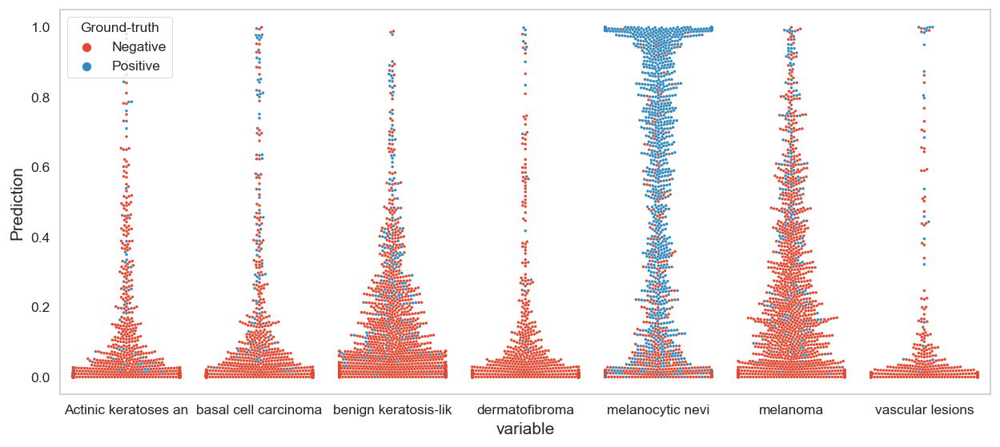

In [45]:
fig, ax1 = plt.subplots(1, 1, figsize=(12, 5))
sns.swarmplot(data=flat_pred_df, hue='Ground-truth', y='Prediction', x='variable', size=2.0, ax=ax1)

<Axes: xlabel='variable', ylabel='Prediction'>

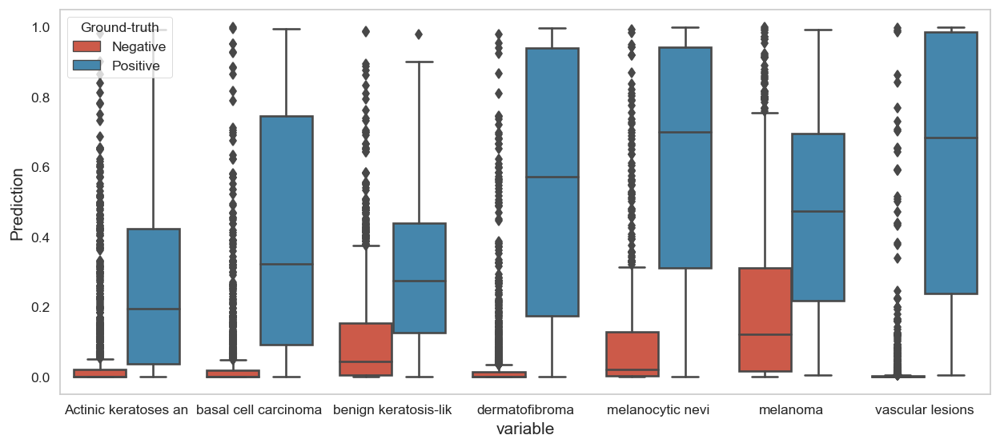

In [46]:
fig, ax1 = plt.subplots(1, 1, figsize=(12, 5))
sns.boxplot(data=flat_pred_df, hue='Ground-truth', y='Prediction', x='variable', ax=ax1)

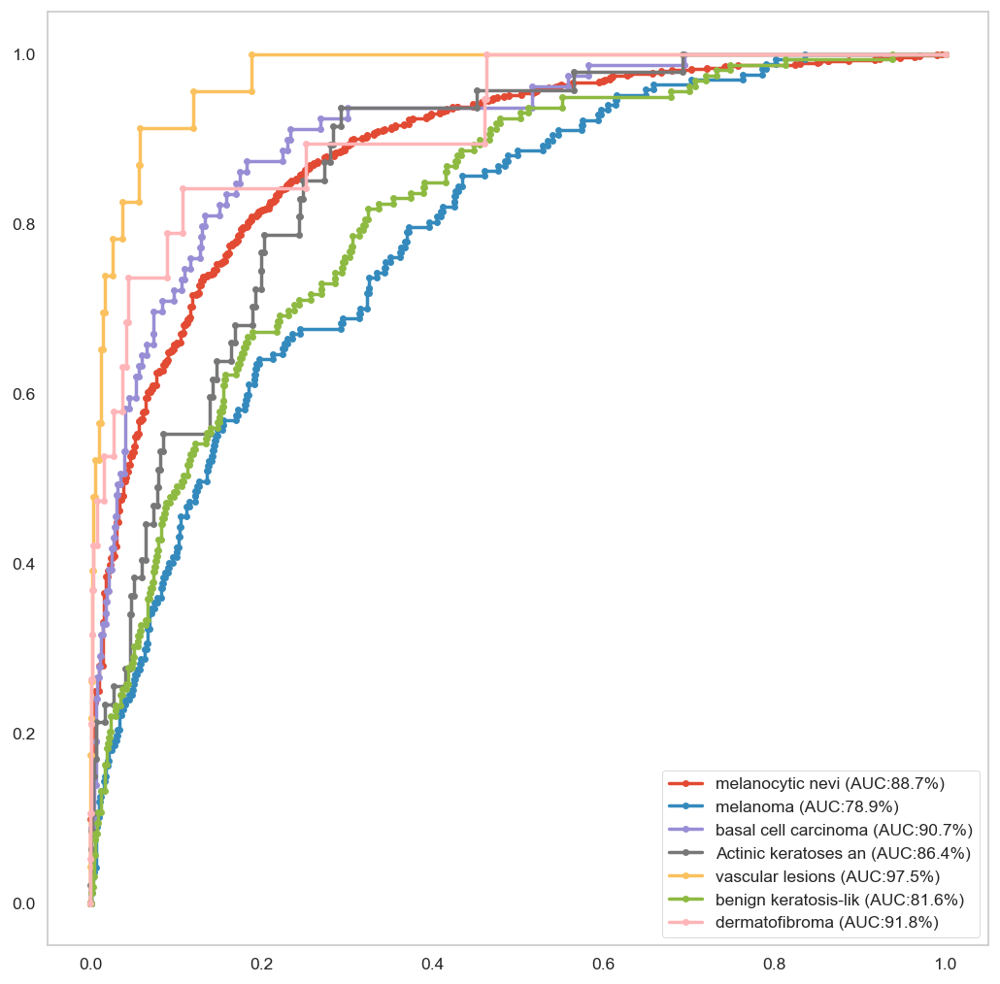

In [47]:
from sklearn.metrics import roc_curve, roc_auc_score
fig, ax1 = plt.subplots(1, 1, figsize=(10, 10))
for i, c_all in enumerate(skin_conditions):
    tpr, fpr, thresh = roc_curve(y_true=t_y_ohe[:, i], y_score=t_yp[:, i])
    auc_roc = roc_auc_score(y_true=t_y_ohe[:, i], y_score=t_yp[:, i])
    ax1.plot(tpr, fpr, '.-', label='{} (AUC:{:2.1%})'.format(c_all, auc_roc), lw=2)
ax1.legend()

47/47 [==============================] - 46s 989ms/step


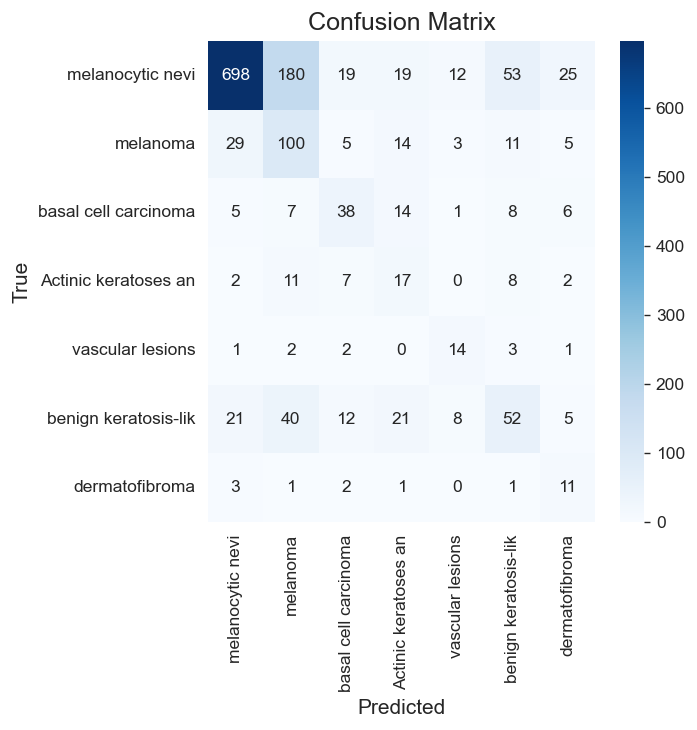

In [48]:
from sklearn.metrics import confusion_matrix, roc_curve, auc
import seaborn as sns

# Get predictions on validation data
valid_pred = skin_model.predict(valid_x)
# Get predicted classes
valid_pred_classes = np.argmax(valid_pred, axis=1)

# Confusion Matrix
conf_matrix = confusion_matrix(valid_y, valid_pred_classes)

# Plot confusion matrix
plt.figure(figsize=(5, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=skin_conditions, yticklabels=skin_conditions)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# # ROC Curve
# plt.figure(figsize=(10, 8))
# for i, c_all in enumerate(skin_conditions):
#     fpr, tpr, _ = roc_curve(valid_y == i, valid_pred[:, i])
#     roc_auc = auc(fpr, tpr)
#     plt.plot(fpr, tpr, label=f'{c_all} (AUC = {roc_auc:.2f})')

# plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('ROC Curve')
# plt.legend()
# plt.show()
